In [2]:
from itertools import combinations
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os
from data_storage import params, maps_1p_TNG

maps_per_group = 15
slice_index = 1

# Parameter labels and units
param_labels = [
    r'\Omega_m',
    r'\sigma_8',
    r'A_{\mathrm{SN1}}',
    r'A_{\mathrm{AGN1}}',
    r'A_{\mathrm{SN2}}',
    r'A_{\mathrm{AGN2}}'
]


param_units = ['', '', '', '', '', '']

fiducial_params = [0.3, 0.8, 3.6, 1, 7.4, 20]  #Extracted these values from the txt file 
fid_map = maps_1p_TNG[6]  # I externally found this

def safe_log(data, floor=1e-1):
    masked = np.ma.masked_less_equal(data, 0)
    return np.log10(np.ma.filled(masked, floor))

def find_fiducial_comparison_cases(param_index, num_cases=4):
    test_cases = []
    used_indices = set()

    for i, j in combinations(range(len(params)), 2):
        if i in used_indices or j in used_indices:
            continue

        # Check if all other parameters match
        other_params_i = np.delete(params[i, :6], param_index)
        other_params_j = np.delete(params[j, :6], param_index)
        one_param_differs = np.allclose(other_params_i, other_params_j)
        param_diff = not np.isclose(params[i, param_index], params[j, param_index])

        is_i_fid = np.allclose(params[i, :6], fiducial_params)
        is_j_fid = np.allclose(params[j, :6], fiducial_params)

        if one_param_differs and param_diff and (is_i_fid ^ is_j_fid):
            if is_i_fid:
                test_cases.append((j, i))  # non-fiducial - fiducial
            else:
                test_cases.append((i, j))
            used_indices.update([i, j])

        if len(test_cases) == num_cases:
            break

    return test_cases

def plot_residual_case(groupA, groupB, slice_index, param_index, test_num):
    mapA = groupA * maps_per_group + slice_index
    mapB = groupB * maps_per_group + slice_index

    map1 = maps_1p_TNG[mapA]  # not fiducial
    map2 = maps_1p_TNG[mapB]  # fiducial
    diff = map1 - map2
    log_map1 = np.log10(map1)
    log_map2 = np.log10(map2)
    log_diff = log_map1 - log_map2

    label = param_labels[param_index]
    unit = param_units[param_index]
    title1 = f'Group {groupA}\n' + rf'${label} = {params[groupA, param_index]:.2f}{unit}$'
    title2 = f'Group {groupB}\n' + rf'${label} = {params[groupB, param_index]:.2f}{unit}$'

    fig, axs = plt.subplots(1, 4, figsize=(20, 9))
    axs = axs.flatten()

    im1 = axs[0].imshow(log_map1, cmap='bwr', origin='lower')
    axs[0].set_title(title1)
    plt.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04,
                 label='log$_{10}$ HI Gas Mass Density [M$_\odot$/h / (kpc/h)$^2$]')

    im2 = axs[1].imshow(log_map2, cmap='bwr', origin='lower')
    axs[1].set_title(title2)
    plt.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04,
                 label='log$_{10}$ HI Gas Mass Density [M$_\odot$/h / (kpc/h)$^2$]')

    im3 = axs[2].imshow(log_diff, cmap='seismic', origin='lower', interpolation='bicubic')
    axs[2].set_title('Fractional Residual: log$_{10}$(map1/map2)')
    plt.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04,
                 label='Signed Fractional Residual (fid)')

    
    im4 = axs[3].imshow(abs(log_diff), cmap = 'Blues_r', origin = 'lower', interpolation = 'bicubic')
    axs[3].set_title('Absolute Residual: abs(log$_{10}$(map1/map2))')
    plt.colorbar(im4, ax=axs[3], fraction = 0.046, pad=0.04,
                 label = 'Absolute  Fractional residual')
    
    total_hi1 = np.sum(10**(log_map1)) # this represents the total H1 in the first map 
    total_hi2 = np.sum(10**(log_map2)) #''' ''' second map 
    #The total HI in the non-fiducial map is X% higher/lower than the fiducial map, suggesting that parameter change Y increases/decreases neutral hydrogen content
    frac_res = (total_hi1-total_hi2)/(total_hi2)
    print(f"Total proxy HI signal MAP1: {total_hi1:.2f}")
    print(f"Total proxy HI signal MAP2: {total_hi2:.2f}")
    print(f"H1 density increased/decreased by {frac_res*100} % w.r.t. fiducial")
    
    label = param_labels[param_index]
    value = params[groupA, param_index]  # or whatever holds the numeric value

    plt.suptitle(rf'Parameter: ${label} = {value:.2f}$ — Test {test_num + 1}', fontsize=18)
    plt.tight_layout(rect=[0, 0.03, 1, 1])
    plt.show()

#     # Save to PDF
#     output_dir = os.path.expanduser('~/Desktop/CAMELS/CMD/CMD/outputs')
#     os.makedirs(output_dir, exist_ok=True)
#     param_name = label.replace('\\', '').replace('{', '').replace('}', '').replace('$', '').replace('mathrm', '').replace('_', '')
#     initial_val = params[groupA, param_index]
#     final_val = params[groupB, param_index]
#     pdf_filename = f'{param_name}_{initial_val:.2f}_to_{final_val:.2f}.pdf'
#     pdf_path = os.path.join(output_dir, pdf_filename)

#     with PdfPages(pdf_path) as pdf:
#         fig_landscape, axs_land = plt.subplots(1, 4, figsize=(18, 6))
#         axs_land = axs_land.flatten()

#         im0 = axs_land[0].imshow(safe_log(map1), cmap='bwr', origin='lower')
#         axs_land[0].set_title(title1)
#         axs_land[0].axis('off')
#         fig_landscape.colorbar(im0, ax=axs_land[0], fraction=0.046, pad=0.04)

#         im1 = axs_land[1].imshow(safe_log(map2), cmap='bwr', origin='lower')
#         axs_land[1].set_title(title2)
#         axs_land[1].axis('off')
#         fig_landscape.colorbar(im1, ax=axs_land[1], fraction=0.046, pad=0.04)

#         im2 = axs_land[2].imshow(safe_log(diff), cmap='magma', origin='lower')
#         axs_land[2].set_title('Signed Residual: log$_{10}$(non-fid − fid)')
#         axs_land[2].axis('off')
#         fig_landscape.colorbar(im2, ax=axs_land[2], fraction=0.046, pad=0.04)

#         im4 = axs_land[3].imshow(safe_log(diff / fid_map), cmap='magma', origin='lower')
#         axs_land[3].set_title('Fractional Residual: log$_{10}$(diff/fiducial)')
#         axs_land[3].axis('off')
#         fig_landscape.colorbar(im4, ax=axs_land[3], fraction=0.046, pad=0.04)

#     fig_landscape.suptitle(f'{param_name}: {initial_val:.2f} → {final_val:.2f}', fontsize=16)
#     plt.tight_layout(rect=[0, 0.05, 1, 0.95])
#     pdf.savefig(fig_landscape)
#     plt.close(fig_landscape)



In [2]:
# parameter 0, Omega_m 
test_cases_omega_m = find_fiducial_comparison_cases(0)
for i, (gA, gB) in enumerate(test_cases_omega_m):
    plot_residual_case(gA, gB, slice_index, param_index=0, test_num=i)

NameError: name 'find_fiducial_comparison_cases' is not defined

In [ ]:
# parameter 1, sigma_8
test_cases_sigma8 = find_fiducial_comparison_cases(1)
for i, (gA, gB) in enumerate(test_cases_sigma8):
    plot_residual_case(gA, gB, slice_index, param_index=1, test_num=i)

In [ ]:
# parameter 2, ASN1
test_cases_sn1 = find_fiducial_comparison_cases(2)
for i, (gA, gB) in enumerate(test_cases_sn1):
    plot_residual_case(gA, gB, slice_index, param_index=2, test_num=i)

In [ ]:
# parameter 3, agn1
test_cases_agn1 = find_fiducial_comparison_cases(3)
for i, (gA, gB) in enumerate(test_cases_agn1):
    plot_residual_case(gA, gB, slice_index, param_index=3, test_num=i)

In [ ]:
# parameter 4: A_ASN2
test_cases_asn2 = find_fiducial_comparison_cases(4)
for i, (gA, gB) in enumerate(test_cases_asn2):
    plot_residual_case(gA, gB, slice_index, param_index=4, test_num=i)

In [ ]:
# parameter 5: A_AGN2
test_cases_agn2 = find_fiducial_comparison_cases(5)
for i, (gA, gB) in enumerate(test_cases_agn2):
    plot_residual_case(gA, gB, slice_index, param_index=5, test_num=i)

In [1]:
import matplotlib.pyplot as plt
import numpy as np


hi_differences = []
hi_signed_differences = []
labels = []

for param_index in range(6):
    total_change = 0
    signed_change = 0
    test_cases = find_fiducial_comparison_cases(param_index, num_cases=4)

    for i, (gA, gB) in enumerate(test_cases):
        mapA = gA * maps_per_group + slice_index
        mapB = gB * maps_per_group + slice_index
        map1 = maps_1p_TNG[mapA]
        map2 = maps_1p_TNG[mapB]

        log_map1 = np.log10(map1)
        log_map2 = np.log10(map2)
        log_diff = log_map1 - log_map2
        
        signed_change += np.sum(log_diff)


        # Accumulate total HI difference
        total_change += np.sum(10 ** np.abs(log_diff))  # proxy for HI disruption

    hi_differences.append(total_change)
    hi_signed_differences.append(signed_change)
    labels.append(param_labels[param_index])

# Plot absolute differnces 
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, hi_differences, color='teal', alpha=0.8)
plt.ylabel('Total HI Disruption Proxy, sum of 10^log10(abs(diff))')
plt.title('HI Sensitivity to Parameter Changes')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Add values on bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1e}', ha='center', va='bottom', fontsize=9)
    
# Plot signed sensitivity
plt.figure(figsize=(12, 6))
bars_signed = plt.bar(labels, hi_signed_differences, color='darkorange', alpha=0.8)
plt.axhline(0, color='black', linewidth=0.8)
plt.ylabel('Net Signed Change: sum(log10(non-fid/fid))')
plt.title('Direction of HI Change by Parameter')
plt.grid(axis='y', linestyle='--', alpha=0.5)
for bar in bars_signed:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height, f'{height:.1e}', ha='center', va='bottom', fontsize=9)
plt.tight_layout()
plt.show()

NameError: name 'find_fiducial_comparison_cases' is not defined

Test 1 — Parameter: \Omega_m
  Initial Value: 0.1
  Final Value:   0.3
  Mean:     0.3472
  Median:   0.3807
  Std Dev:  0.8440
  Skewness: -1.5345
  Kurtosis: 18.0267


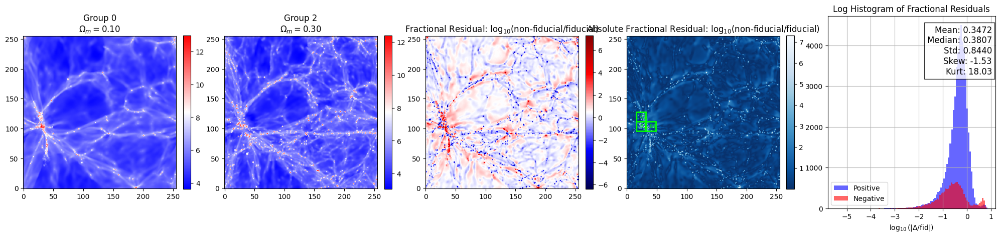

Test 2 — Parameter: \Omega_m
  Initial Value: 0.2
  Final Value:   0.3
  Mean:     0.1612
  Median:   0.1985
  Std Dev:  0.7457
  Skewness: -1.2172
  Kurtosis: 26.5440


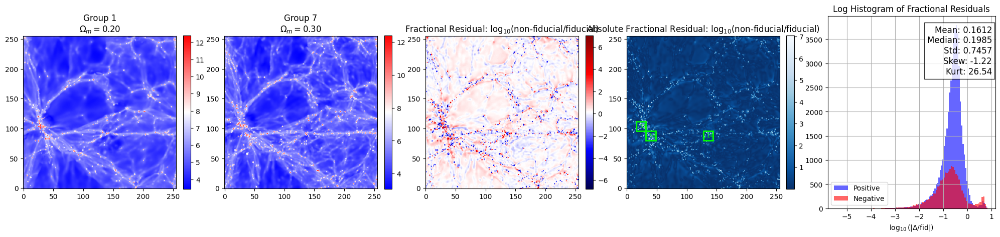

Test 3 — Parameter: \Omega_m
  Initial Value: 0.4
  Final Value:   0.3
  Mean:     -0.1011
  Median:   -0.0525
  Std Dev:  0.7698
  Skewness: -0.3182
  Kurtosis: 26.1963


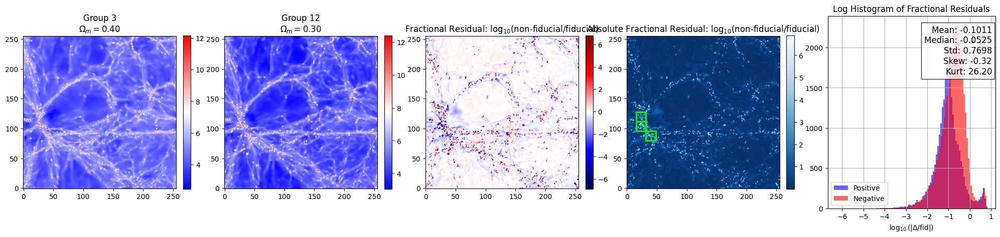

Test 4 — Parameter: \Omega_m
  Initial Value: 0.5
  Final Value:   0.3
  Mean:     -0.2733
  Median:   -0.2684
  Std Dev:  0.9289
  Skewness: 0.3838
  Kurtosis: 18.2741


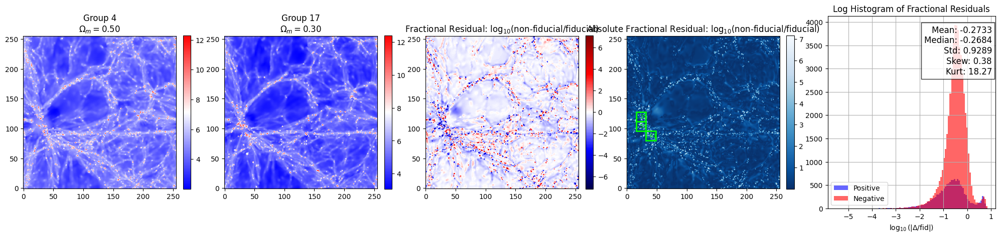

Test 1 — Parameter: \sigma_8
  Initial Value: 0.6
  Final Value:   0.8
  Mean:     0.2593
  Median:   0.2548
  Std Dev:  0.9897
  Skewness: 0.0227
  Kurtosis: 15.2232


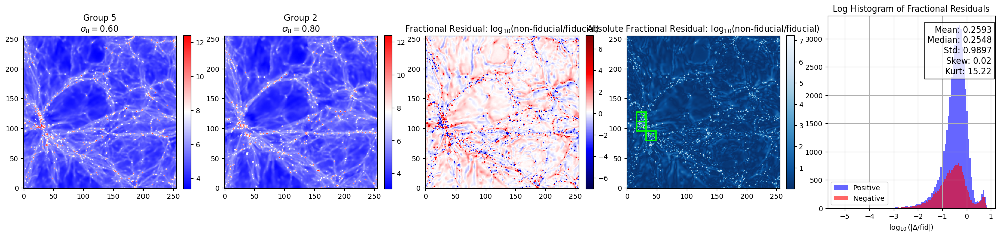

Test 2 — Parameter: \sigma_8
  Initial Value: 0.7
  Final Value:   0.8
  Mean:     0.1344
  Median:   0.1634
  Std Dev:  0.8394
  Skewness: -0.3567
  Kurtosis: 21.7862


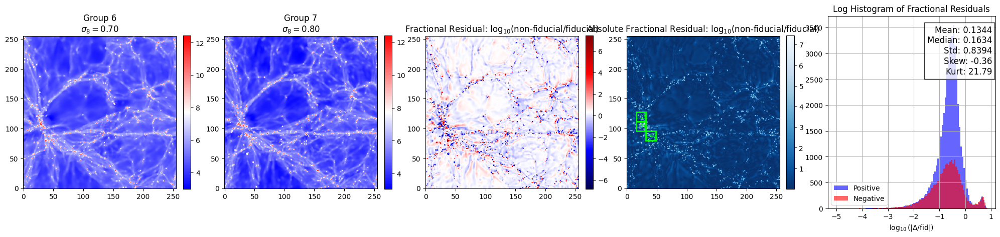

Test 3 — Parameter: \sigma_8
  Initial Value: 0.9
  Final Value:   0.8
  Mean:     -0.0780
  Median:   -0.0341
  Std Dev:  0.8073
  Skewness: -0.5064
  Kurtosis: 23.8162


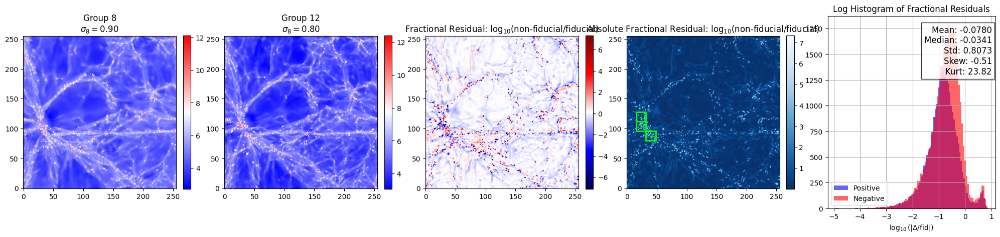

Test 4 — Parameter: \sigma_8
  Initial Value: 1.0
  Final Value:   0.8
  Mean:     -0.2158
  Median:   -0.2171
  Std Dev:  0.9518
  Skewness: 0.0618
  Kurtosis: 16.1604


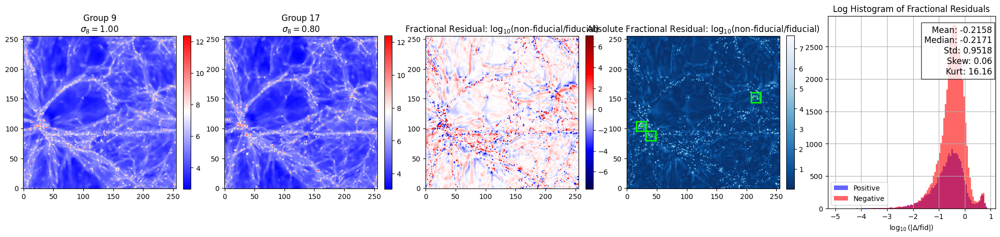

Test 1 — Parameter: A_{\mathrm{SN1}}
  Initial Value: 0.9
  Final Value:   3.6
  Mean:     -0.0704
  Median:   -0.0089
  Std Dev:  0.3113
  Skewness: -2.1078
  Kurtosis: 76.7965


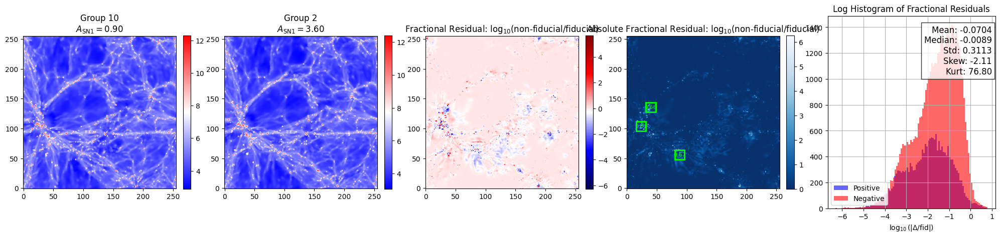

Test 2 — Parameter: A_{\mathrm{SN1}}
  Initial Value: 1.8
  Final Value:   3.6
  Mean:     -0.0034
  Median:   0.0284
  Std Dev:  0.3260
  Skewness: -3.0212
  Kurtosis: 67.7275


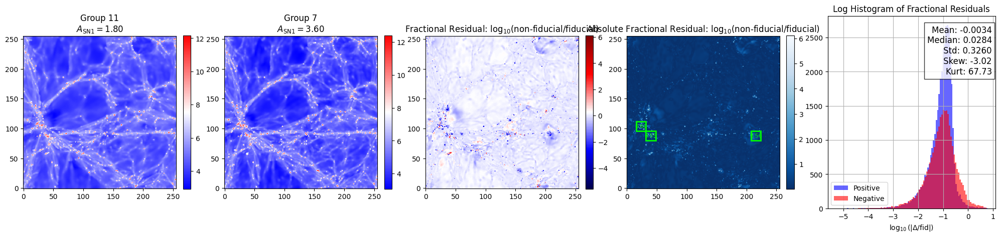

Test 3 — Parameter: A_{\mathrm{SN1}}
  Initial Value: 7.2
  Final Value:   3.6
  Mean:     0.0479
  Median:   0.0591
  Std Dev:  0.3078
  Skewness: -1.9829
  Kurtosis: 83.6319


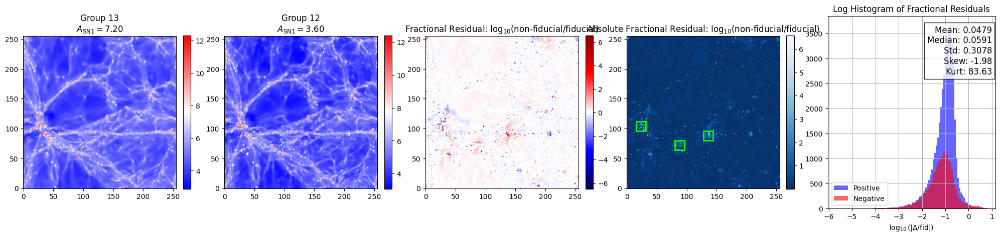

Test 4 — Parameter: A_{\mathrm{SN1}}
  Initial Value: 14.4
  Final Value:   3.6
  Mean:     0.0208
  Median:   0.0007
  Std Dev:  0.2585
  Skewness: 1.1626
  Kurtosis: 121.4714


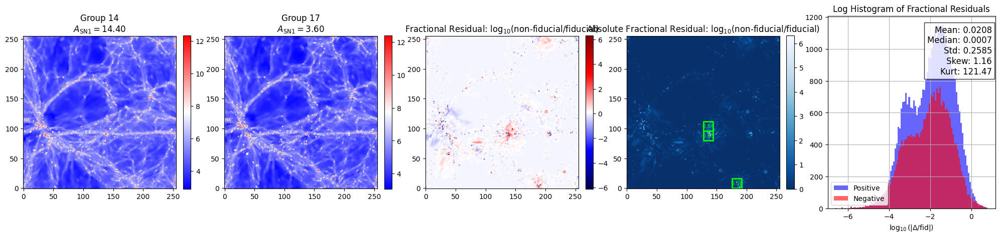

Test 1 — Parameter: A_{\mathrm{AGN1}}
  Initial Value: 0.25
  Final Value:   1.0
  Mean:     0.0026
  Median:   0.0002
  Std Dev:  0.2326
  Skewness: 1.3635
  Kurtosis: 144.5236


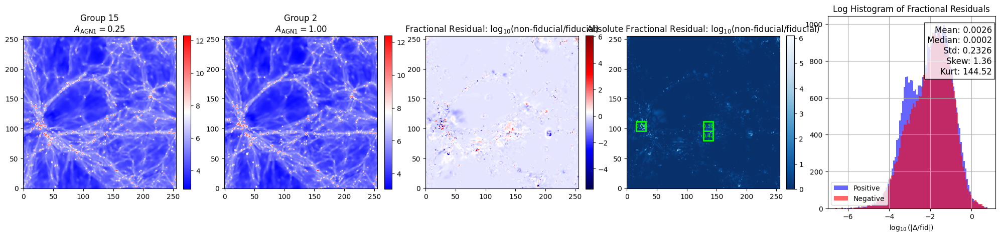

Test 2 — Parameter: A_{\mathrm{AGN1}}
  Initial Value: 0.5
  Final Value:   1.0
  Mean:     0.0318
  Median:   0.0479
  Std Dev:  0.2973
  Skewness: -2.1879
  Kurtosis: 81.4454


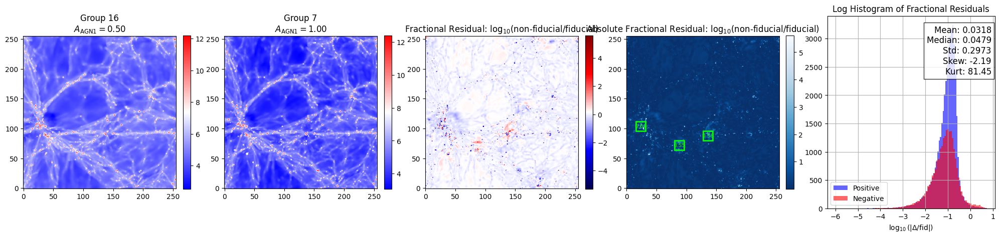

Test 3 — Parameter: A_{\mathrm{AGN1}}
  Initial Value: 2.0
  Final Value:   1.0
  Mean:     0.0253
  Median:   0.0446
  Std Dev:  0.2989
  Skewness: -2.9047
  Kurtosis: 87.9783


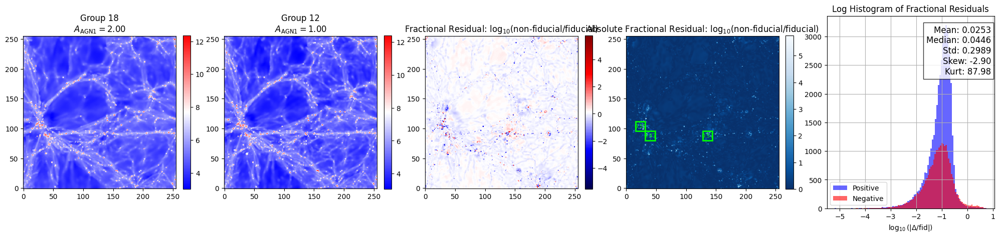

Test 4 — Parameter: A_{\mathrm{AGN1}}
  Initial Value: 4.0
  Final Value:   1.0
  Mean:     -0.0130
  Median:   -0.0002
  Std Dev:  0.2300
  Skewness: -0.4969
  Kurtosis: 127.1115


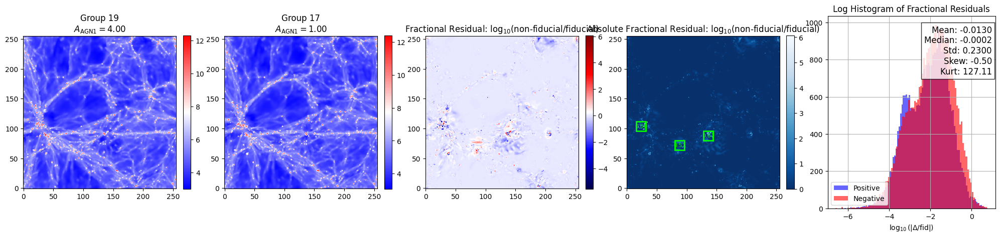

Test 1 — Parameter: A_{\mathrm{SN2}}
  Initial Value: 3.7
  Final Value:   7.4
  Mean:     -0.0617
  Median:   -0.0023
  Std Dev:  0.3165
  Skewness: -1.6128
  Kurtosis: 84.4730


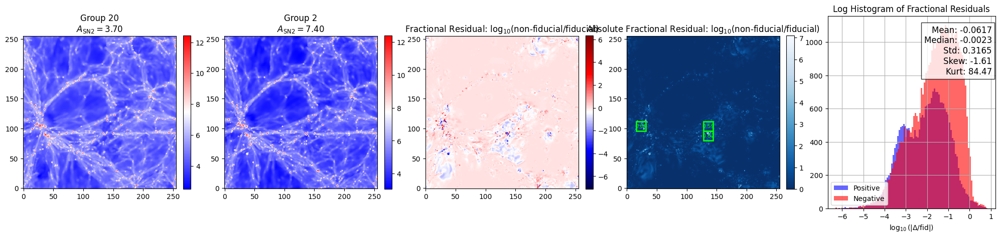

Test 2 — Parameter: A_{\mathrm{SN2}}
  Initial Value: 5.233
  Final Value:   7.4
  Mean:     0.0074
  Median:   0.0350
  Std Dev:  0.3167
  Skewness: -2.7219
  Kurtosis: 75.2726


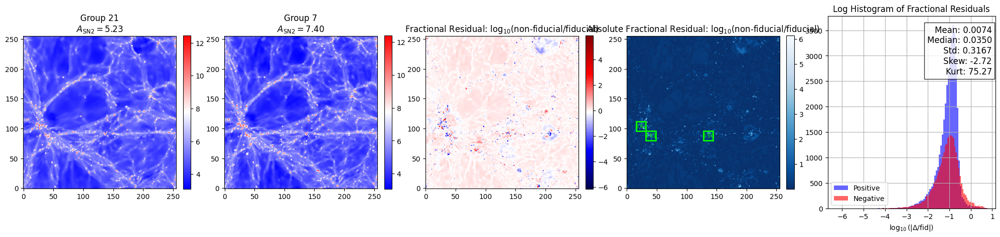

Test 3 — Parameter: A_{\mathrm{SN2}}
  Initial Value: 10.47
  Final Value:   7.4
  Mean:     0.0426
  Median:   0.0596
  Std Dev:  0.3004
  Skewness: -3.0444
  Kurtosis: 85.7033


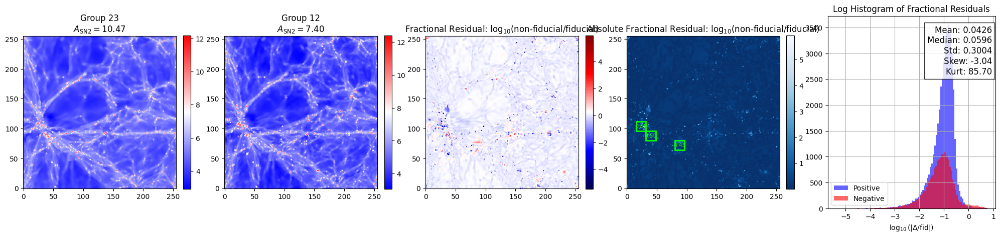

Test 4 — Parameter: A_{\mathrm{SN2}}
  Initial Value: 14.8
  Final Value:   7.4
  Mean:     0.0126
  Median:   0.0007
  Std Dev:  0.2651
  Skewness: -2.2942
  Kurtosis: 112.0979


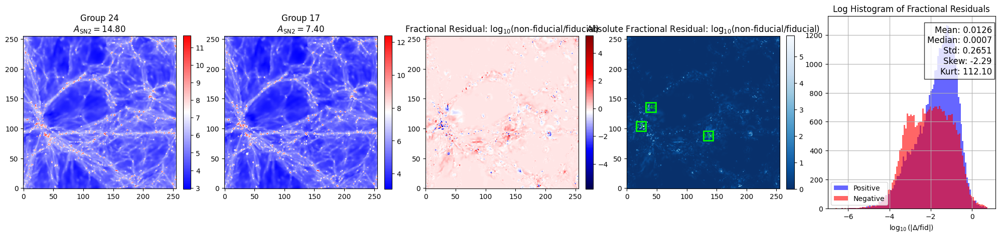

Test 1 — Parameter: A_{\mathrm{AGN2}}
  Initial Value: 10.0
  Final Value:   20.0
  Mean:     0.0100
  Median:   0.0002
  Std Dev:  0.2260
  Skewness: 2.1027
  Kurtosis: 145.5817


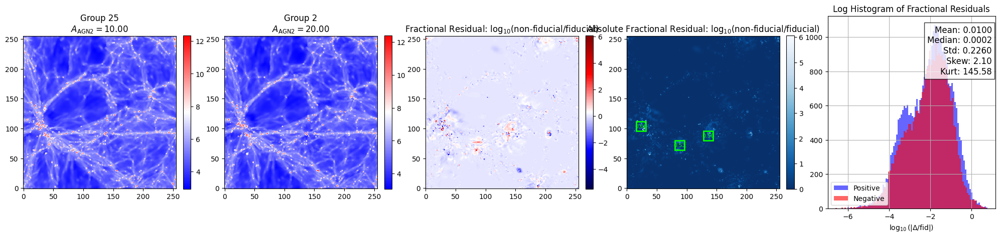

Test 2 — Parameter: A_{\mathrm{AGN2}}
  Initial Value: 14.14
  Final Value:   20.0
  Mean:     0.0352
  Median:   0.0495
  Std Dev:  0.3016
  Skewness: -1.8529
  Kurtosis: 80.8208


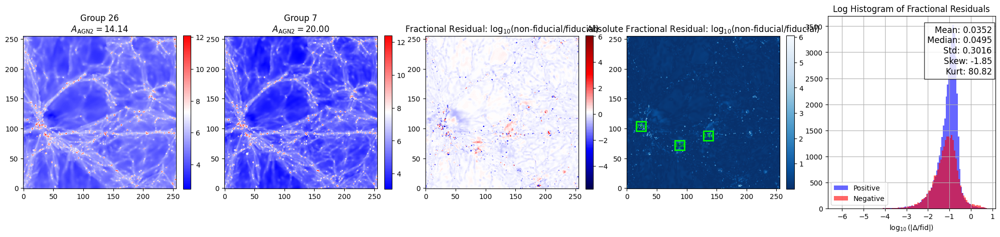

Test 3 — Parameter: A_{\mathrm{AGN2}}
  Initial Value: 28.28
  Final Value:   20.0
  Mean:     0.0222
  Median:   0.0427
  Std Dev:  0.2949
  Skewness: -2.1908
  Kurtosis: 80.5138


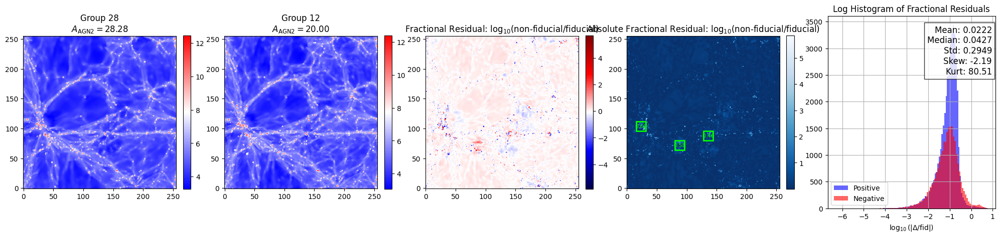

Test 4 — Parameter: A_{\mathrm{AGN2}}
  Initial Value: 40.0
  Final Value:   20.0
  Mean:     -0.0341
  Median:   -0.0002
  Std Dev:  0.2405
  Skewness: -1.3710
  Kurtosis: 114.1922


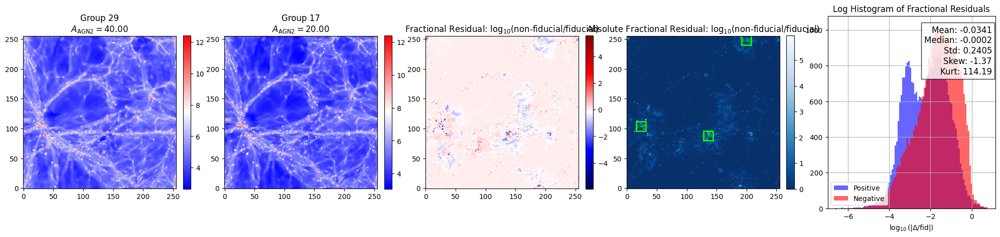

In [ ]:
from itertools import combinations
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os
from scipy import stats
from skimage.util import view_as_blocks


maps_per_group = 15
slice_index = 1

# Parameter labels and units
param_labels = [
    r'$\Omega_m$',
    r'$\sigma_8$',
    r'A_{\mathrm{SN1}}',
    r'A_{\mathrm{AGN1}}',
    r'A_{\mathrm{SN2}}',
    r'A_{\mathrm{AGN2}}']
param_units = ['', '', '', '', '', '']

fiducial_params = [0.3, 0.8, 3.6, 1, 7.4, 20]
fid_map = maps_1p_TNG[6]  # Assume maps_1p_TNG is loaded externally

def safe_log(data, floor=1e-4):
    masked = np.ma.masked_less_equal(data, 0)
    return np.log10(np.ma.filled(masked, floor))

def find_fiducial_comparison_cases(param_index, num_cases=4):
    test_cases = []
    used_indices = set()

    for i, j in combinations(range(len(params)), 2):
        if i in used_indices or j in used_indices:
            continue

        # Check if all other parameters match
        other_params_i = np.delete(params[i, :6], param_index)
        other_params_j = np.delete(params[j, :6], param_index)
        one_param_differs = np.allclose(other_params_i, other_params_j)
        param_diff = not np.isclose(params[i, param_index], params[j, param_index])

        is_i_fid = np.allclose(params[i, :6], fiducial_params)
        is_j_fid = np.allclose(params[j, :6], fiducial_params)

        if one_param_differs and param_diff and (is_i_fid ^ is_j_fid):
            if is_i_fid:
                test_cases.append((j, i))  # non-fiducial - fiducial
            else:
                test_cases.append((i, j))
            used_indices.update([i, j])

        if len(test_cases) == num_cases:
            break

    return test_cases

all_means = []
all_medians = []

def plot_residual_and_histogram(groupA, groupB, slice_index, param_index, test_num):
    # === Get maps and parameter values ===
    mapA = groupA * maps_per_group + slice_index
    mapB = groupB * maps_per_group + slice_index
    map1 = maps_1p_TNG[mapA]  # non-fiducial
    map2 = maps_1p_TNG[mapB]  # fiducial
    log_diff = np.log10(map1) - np.log10(map2)

    # === Add safe handling for fractional residuals ===

    label = param_labels[param_index]
    unit = param_units[param_index]
    initial_val = params[groupA, param_index]
    final_val = params[groupB, param_index]
    

    # Step 1: Compute mean residuals per tile
    tile_size = 16
    abs_diff = np.abs(log_diff)
    blocks = view_as_blocks(abs_diff, block_shape=(tile_size, tile_size))
    tile_means = blocks.mean(axis=(2, 3))

    # Step 2: Get top-k blocks
    k = 3  # top-k most sensitive blocks
    flat_indices = tile_means.flatten().argsort()[-k:][::-1]  # sort descending
    highlight_coords = [(i // tile_means.shape[1], i % tile_means.shape[1]) for i in flat_indices]


    # === Flatten and clean residuals ===
    flat_res = log_diff.flatten()
    flat_res = flat_res[~np.isnan(flat_res)]

    # Separate positive and negative residuals
    pos_res = flat_res[flat_res > 0]
    neg_res = -flat_res[flat_res < 0]  # make negative values positive for plotting

    # === Compute stats ===
    mean_val = np.mean(flat_res)         # original signed mean

    median_val = np.median(flat_res)
    std_val = np.std(flat_res)
    skew_val = stats.skew(flat_res)
    kurt_val = stats.kurtosis(flat_res)

    # Save results for later plotting (choose which one to store)
    all_means.append(mean_val)      # or append both if useful
    all_medians.append(median_val)



    print(f"Test {test_num + 1} — Parameter: {label}")
    print(f"  Initial Value: {initial_val}")
    print(f"  Final Value:   {final_val}")
    print(f"  Mean:     {mean_val:.4f}")
    print(f"  Median:   {median_val:.4f}")
    print(f"  Std Dev:  {std_val:.4f}")
    print(f"  Skewness: {skew_val:.4f}")
    print(f"  Kurtosis: {kurt_val:.4f}")

    # === Plot ===
    fig, axs = plt.subplots(1, 5, figsize=(25, 5))
    
    # Map 1
    im1 = axs[0].imshow(safe_log(map1), cmap='bwr', origin='lower')
    axs[0].set_title(f'Group {groupA}\n' + rf'${label} = {initial_val:.2f}{unit}$')
    fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)

    # Map 2
    im2 = axs[1].imshow(safe_log(map2), cmap='bwr', origin='lower')
    axs[1].set_title(f'Group {groupB}\n' + rf'${label} = {final_val:.2f}{unit}$')
    fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

    # Residual
    im3 = axs[2].imshow(log_diff, cmap='seismic', origin='lower')
    axs[2].set_title('Fractional Residual: log$_{10}$(non-fiducial/fiducial)')
    fig.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04)
    
    # Step 3: Draw rectangles on the abs residual map
    for tile_row, tile_col in highlight_coords:
        y = tile_row * tile_size
        x = tile_col * tile_size
        rect = plt.Rectangle((x, y), tile_size, tile_size, linewidth=2, edgecolor='lime', facecolor='none')
        axs[3].add_patch(rect)
        axs[3].text(x + tile_size/2, y + tile_size/2, f'{tile_means[tile_row, tile_col]:.2f}',
                    color='lime', fontsize=8, ha='center', va='center')


    # Frac Residual
    im4 = axs[3].imshow(abs(log_diff), cmap='Blues_r', origin='lower')
    axs[3].set_title('Absolute Fractional Residual: log$_{10}$(non-fiducial/fiducial)')
    fig.colorbar(im4, ax=axs[3], fraction=0.046, pad=0.04)

    # Histogram + stats
    axs[4].hist(np.log10(pos_res), bins=100, color='blue', alpha=0.6, label='Positive')
    axs[4].hist(np.log10(neg_res), bins=100, color='red', alpha=0.6, label='Negative')
    axs[4].set_title('Log Histogram of Fractional Residuals')
    axs[4].set_xlabel(r'$\log_{10}(|\Delta / \mathrm{fid}|)$')
    axs[4].grid(True)

    # Move legend to lower-left to avoid overlapping with stats box
    axs[4].legend(loc='lower left')

    # Stats box in top-righ
    #.00t corner
    stats_text = (
    f"Mean: {mean_val:.4f}\n"
    f"Median: {median_val:.4f}\n"
    f"Std: {std_val:.4f}\n"
    f"Skew: {skew_val:.2f}\n"
    f"Kurt: {kurt_val:.2f}"
)

    axs[4].text(0.98, 0.95, stats_text,
                transform=axs[4].transAxes, fontsize=12,
                ha='right', va='top',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='black'))


#     # Title + Save
#     param_name = label.replace('\\', '').replace('{', '').replace('}', '').replace('$', '').replace('mathrm', '').replace('_', '')
#     fig.suptitle(f'Test {test_num + 1}: {param_name} {initial_val:.2f} → {final_val:.2f}', fontsize=18)
#     plt.tight_layout(rect=[0, 0.03, 1, 0.95])

#     output_dir = os.path.expanduser('~/Desktop/CAMELS/CMD/CMD/outputs/combined')
#     os.makedirs(output_dir, exist_ok=True)
#     pdf_filename = f"{test_num+1:02d}_{param_name}_{initial_val:.2f}_to_{final_val:.2f}_combined.pdf"
#     pdf_path = os.path.join(output_dir, pdf_filename)

#     with PdfPages(pdf_path) as pdf:
#         pdf.savefig(fig)
#         plt.close(fig)

    # Optional: show inline
    plt.show()


for param_index in range(6):
    test_cases = find_fiducial_comparison_cases(param_index)

    for i, (gA, gB) in enumerate(test_cases):
        plot_residual_and_histogram(
            groupA=gA,
            groupB=gB,
            slice_index=slice_index,
            param_index=param_index,
            test_num=i
        )


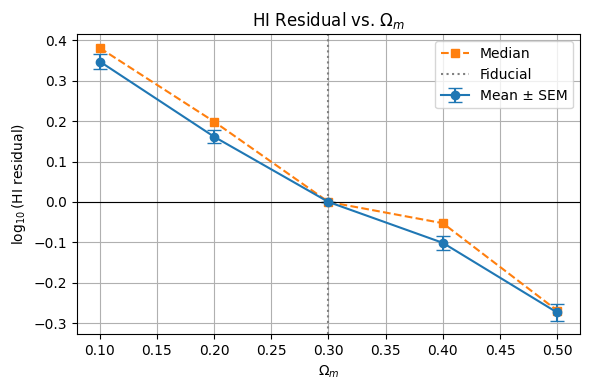

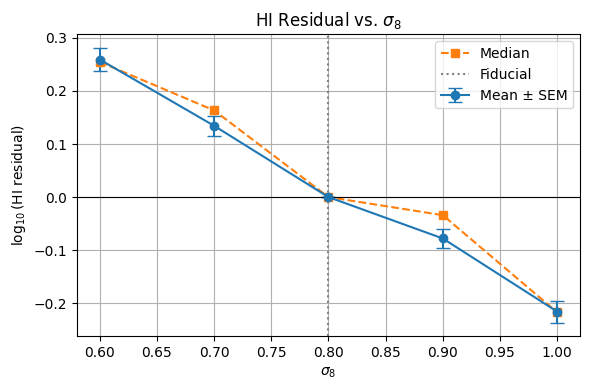

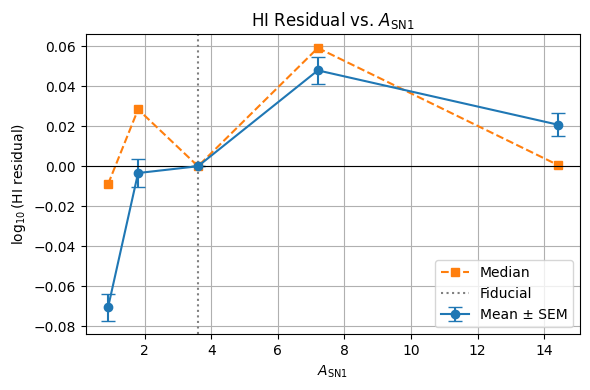

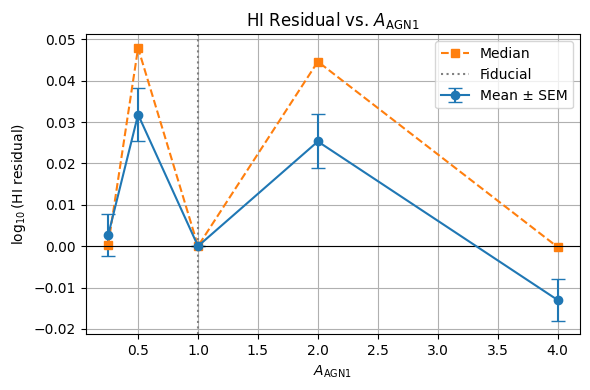

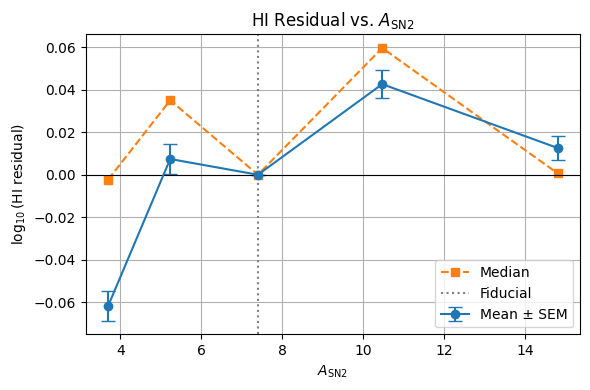

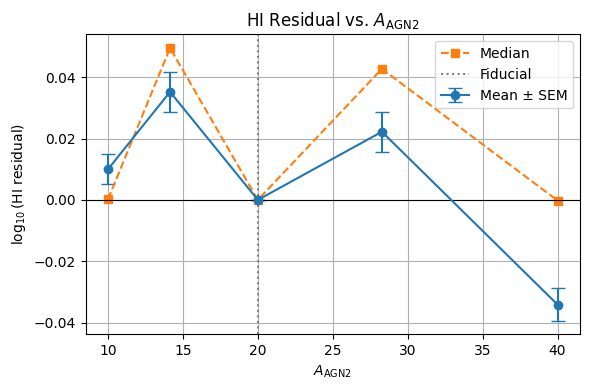

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Data for each parameter
param_data = [
    {
        "label": r'$\Omega_m$',
        "fiducial": 0.3,
        "x": [0.1, 0.2, 0.3, 0.4, 0.5],
        "mean": [0.3472, 0.1612, 0.0, -0.1011, -0.2733],
        "median": [0.3807, 0.1985, 0.0, -0.0525, -0.2684],
        "std": [0.8440, 0.7457, 0.0, 0.7698, 0.9289],
    },
    {
        "label": r'$\sigma_8$',
        "fiducial": 0.8,
        "x": [0.6, 0.7, 0.8, 0.9, 1.0],
        "mean": [0.2593, 0.1344, 0.0, -0.0780, -0.2158],
        "median": [0.2548, 0.1634, 0.0, -0.0341, -0.2171],
        "std": [0.9897, 0.8394, 0.0, 0.8073, 0.9518],
    },
    {
        "label": r'$A_{\mathrm{SN1}}$',
        "fiducial": 3.6,
        "x": [0.9, 1.8, 3.6, 7.2, 14.4],
        "mean": [-0.0704, -0.0034, 0.0, 0.0479, 0.0208],
        "median": [-0.0089, 0.0284, 0.0, 0.0591, 0.0007],
        "std": [0.3113, 0.3260, 0.0, 0.3078, 0.2585],
    },
    {
        "label": r'$A_{\mathrm{AGN1}}$',
        "fiducial": 1.0,
        "x": [0.25, 0.5, 1.0, 2.0, 4.0],
        "mean": [0.0026, 0.0318, 0.0, 0.0253, -0.0130],
        "median": [0.0002, 0.0479, 0.0, 0.0446, -0.0002],
        "std": [0.2326, 0.2973, 0.0, 0.2989, 0.2300],
    },
    {
        "label": r'$A_{\mathrm{SN2}}$',
        "fiducial": 7.4,
        "x": [3.7, 5.233, 7.4, 10.47, 14.8],
        "mean": [-0.0617, 0.0074, 0.0, 0.0426, 0.0126],
        "median": [-0.0023, 0.0350, 0.0, 0.0596, 0.0007],
        "std": [0.3165, 0.3167, 0.0, 0.3004, 0.2651],
    },
    {
        "label": r'$A_{\mathrm{AGN2}}$',
        "fiducial": 20.0,
        "x": [10.0, 14.14, 20.0, 28.28, 40.0],
        "mean": [0.0100, 0.0352, 0.0, 0.0222, -0.0341],
        "median": [0.0002, 0.0495, 0.0, 0.0427, -0.0002],
        "std": [0.2260, 0.3016, 0.0, 0.2949, 0.2405],
    }
]

N = 2100  # number of samples used to compute mean

# Plot all 6 parameters
for param in param_data:
    sem = np.array(param["std"]) / np.sqrt(N)
    plt.figure(figsize=(6, 4))
    plt.errorbar(param["x"], param["mean"], yerr=sem, fmt='o-', capsize=5, label='Mean ± SEM')
    plt.plot(param["x"], param["median"], 's--', label='Median')
    plt.axvline(param["fiducial"], color='gray', linestyle=':', label='Fiducial')
    plt.axhline(0, color='black', linewidth=0.8)
    plt.xlabel(param["label"])
    plt.ylabel(r'$\log_{10}$(HI residual)')
    plt.title(f'HI Residual vs. {param["label"]}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
